In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split,  cross_val_score
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import KFold

import xgboost as xgb
import matplotlib.pyplot as plt
plt.rcParams['figure.facecolor']='white'
plt.rcParams['figure.figsize'] = (8, 5)
import shap

from skopt import BayesSearchCV
from sklearn.model_selection import StratifiedKFold


In [2]:
data = pd.read_csv(r'Napus_Feature_table.csv', sep='\t')
data.tail()

,Name,chrA01,chrA02,chrA03,chrA04,chrA05,chrA06,chrA07,chrA08,chrA09,...,LTR Gypsy repeats 3kb downstream,LTR unknown repeats 3kb downstream,MITE DTA repeats 3kb downstream,MITE DTC repeats 3kb downstream,MITE DTH repeats 3kb downstream,MITE DTM repeats 3kb downstream,MITE DTT repeats 3kb downstream,unknown repeats 3kb downstream,Variable,Variable in synth
119386,evm.model.chrC09.8639,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
119387,evm.model.chrC09.8640,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
119388,evm.model.chrC09.8641,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
119389,evm.model.chrC09.8642,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
119390,evm.model.chrC09.8643,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [3]:
del data['Variable in synth']
del data['Name']


In [4]:
from collections import Counter

c = Counter(data['Variable'])
var = c[1]/(c[0]+c[1])*100
core = 100-c[1]/(c[0]+c[1])*100

print('we have %.2f percentage of variable genes/ %.2f core genes in at least 2 inds.'%( var, core))
# Control the balance of positive and negative weights, useful for unbalanced classes. 
# A typical value to consider: sum(negative instances) / sum(positive instances). 
# See Parameters Tuning for more discussion. Also, see Higgs Kaggle competition demo for examples: R, py1, py2, py3.

my_scale_pos_weight = c[0]/c[1]
print(my_scale_pos_weight)

we have 15.98 percentage of variable genes/ 84.02 core genes in at least 2 inds.
5.2567340949586


In [5]:
# Correlation between the features and the predictor- SalePrice
predictor = data['Variable']
fields = [x for x in data.columns if x != 'Variable']
correlations = data[fields].corrwith(predictor)
correlations = correlations.sort_values(ascending = False)
# correlations
corrs = (correlations
            .to_frame()
            .reset_index()
            .rename(columns={'level_0':'feature1',
                                0:'Correlations'}))
pd.concat([corrs.head(),corrs.tail()], axis=0)

,index,Correlations
0,chrC02,0.094887
1,chrC01,0.080101
2,Length of chromosome,0.072035
3,MITE_DTM overlap,0.062098
4,MITE DTM repeats 1kb downstream,0.056268
137,chrA06,-0.033212
138,chrA03,-0.035490
139,A genome,-0.038280
140,chrC07,-0.040905
141,Homeologous block,-0.061446


In [6]:
def model_to_beat(input):
    return 'this is a core gene'

# this model has a 84.02% accuracy

In [7]:
data.columns

Index(['chrA01', 'chrA02', 'chrA03', 'chrA04', 'chrA05', 'chrA06', 'chrA07',
       'chrA08', 'chrA09', 'chrA10',
       ...
       'LTR Copia repeats 3kb downstream', 'LTR Gypsy repeats 3kb downstream',
       'LTR unknown repeats 3kb downstream', 'MITE DTA repeats 3kb downstream',
       'MITE DTC repeats 3kb downstream', 'MITE DTH repeats 3kb downstream',
       'MITE DTM repeats 3kb downstream', 'MITE DTT repeats 3kb downstream',
       'unknown repeats 3kb downstream', 'Variable'],
      dtype='object', length=143)

(array([1.04184e+05, 1.31360e+04, 1.59300e+03, 3.34000e+02, 8.80000e+01,
        1.80000e+01, 2.20000e+01, 9.00000e+00, 3.00000e+00, 4.00000e+00]),
 array([  49. ,  593.2, 1137.4, 1681.6, 2225.8, 2770. , 3314.2, 3858.4,
        4402.6, 4946.8, 5491. ]),
 <a list of 10 Patch objects>)

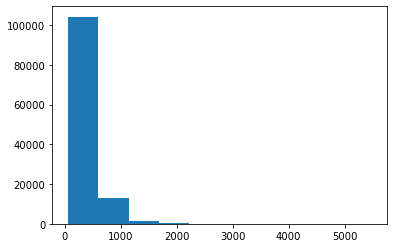

In [8]:
plt.hist(data['Gene length'])

(array([17696., 20604., 19255., 18926., 17083., 11526.,  6602.,  5294.,
         1620.,   785.]),
 array([1.85583765e-05, 9.95912613e-02, 1.99163964e-01, 2.98736667e-01,
        3.98309370e-01, 4.97882073e-01, 5.97454776e-01, 6.97027479e-01,
        7.96600182e-01, 8.96172885e-01, 9.95745588e-01]),
 <a list of 10 Patch objects>)

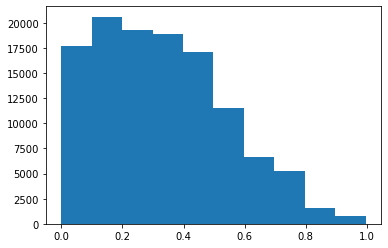

In [9]:
plt.hist(data['Distance to centromere'])

In [10]:
from sklearn.preprocessing import MinMaxScaler

data[['GC',
      'Gene length', 
      'Number of exons']] = MinMaxScaler().fit_transform(data[['GC', 
                                                               'Gene length', 
                                                               'Number of exons']])

In [11]:
X, y = data.iloc[:,:-1],data.iloc[:,-1]

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=123, 
                                                    stratify=data['Variable'])

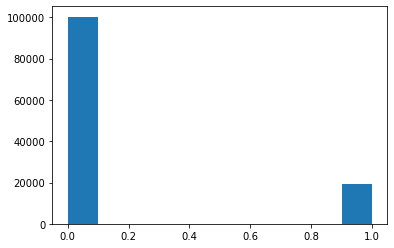

In [13]:
plt.hist(data['Variable']);

# XGBoost

In [14]:
my_scale_pos_weight = data['Variable'][data['Variable'] == 1].size / data['Variable'][data['Variable'] == 0].size


In [15]:
# this is model 1
#xg_reg = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.07,
#                max_depth = 10, alpha = 10, n_estimators = 100, scale_pos_weight = 0.3,
#                          min_child_weight = 1, seed = 123, nthread=4, )
# # thefollowing model (2) takes much longer to train, with a very similar accuracy to the simplest one (3)
# the accuracy on the training set is 100%, but SHAP takes forever wit this model
#xg_reg = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.07,
#                max_depth = 100, alpha = 10, n_estimators = 300, 
#                          min_child_weight = 1, seed = 123, nthread=4, ) 
# this is the simplest model (3)
xg_reg = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.07,
                max_depth = 10, alpha = 10, n_estimators = 100, eval_metric= 'auc',
   scale_post_weight = my_scale_pos_weight
)


In [16]:
from sklearn.utils.class_weight import compute_sample_weight
# whether I use this weight or not seems to be pointless?
weight = compute_sample_weight(class_weight = 'balanced', y = y_train)


In [17]:
xg_reg.fit(X_train,y_train, sample_weight = weight, verbose=True)

preds = xg_reg.predict(X_test)

In [18]:
accuracy = accuracy_score(y_test, preds)
print(accuracy)

0.773524854474643


In [19]:
all_preds = xg_reg.predict(X)

# Different cutoff test

In [166]:
y_pred_diff = (xg_reg.predict_proba(X)[:,1] >= 0.16).astype(bool) # set threshold as 0.16

In [34]:
get_confusion_matrix(y, y_pred_diff, normalize=True)

NameError: name 'y_pred_diff' is not defined

In [168]:
print(accuracy_score(y, y_pred_diff))

0.7808880066336659


Wow, very different! Now the two classes are equal!

# Confusion matrix

In [20]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, preds)
print(cm)

[[16471  3591]
 [ 1817  2000]]


* 99.5% of conserved genes are correctly predicted as conserved (true label: 0, predicted label: 0)
* 76% of variable genes are predicted to be conserved! (true label: 1, predicted label: 0), 
* 24% of variable genes are predicted to be variable

# Check probabilities of predictions

By default, scikit-learn has a proba cutoff for 0.5 - if proba < 0.5, it's a core gene, if 0.5, it's a variable gene. 
Currently, most variable genes are misclassified. Can we shift that 0.5 cutoff to get a more accurate prediction?

In [21]:
Compprobs = xg_reg.predict_proba(X_test)

# Compprobs[:,0] is the core gene probability
# Compprobs[:,1] is the variable gene probability
comp_df = pd.DataFrame({'core_prob':Compprobs[:,0], 
              'var_prob':Compprobs[:,1], 
              'truelabel':y_test,
              'predictions':preds})
comp_df.head()

,core_prob,var_prob,truelabel,predictions
64443,0.441650,0.558350,0,1
62388,0.662887,0.337113,0,0
96146,0.732907,0.267093,0,0
78084,0.491963,0.508037,0,1
71845,0.489426,0.510574,1,1


In [22]:
y_test

64443     0
62388     0
96146     0
78084     0
71845     1
         ..
13562     0
80890     1
69478     0
101105    0
96590     0
Name: Variable, Length: 23879, dtype: int64

In [23]:
core_correct_df = comp_df[(comp_df.truelabel == 0) & (comp_df.predictions == 0)]
core_correct_df.head()

,core_prob,var_prob,truelabel,predictions
62388,0.662887,0.337113,0,0
96146,0.732907,0.267093,0,0
91023,0.701222,0.298778,0,0
96952,0.687110,0.312890,0,0
67682,0.537841,0.462159,0,0


In [24]:
var_incorrect_df = comp_df[(comp_df.truelabel == 1) & (comp_df.predictions == 0)]
var_incorrect_df.head()

,core_prob,var_prob,truelabel,predictions
32499,0.515031,0.484969,1,0
80464,0.569703,0.430297,1,0
65207,0.648702,0.351298,1,0
63682,0.565938,0.434062,1,0
90658,0.674664,0.325336,1,0


In [25]:
var_correct_df = comp_df[(comp_df.truelabel == 1) & (comp_df.predictions == 1)]
var_correct_df.head()

,core_prob,var_prob,truelabel,predictions
71845,0.489426,0.510574,1,1
17960,0.435906,0.564094,1,1
5281,0.145530,0.854470,1,1
83875,0.409030,0.590970,1,1
56805,0.153579,0.846421,1,1


Text(0.5, 0, 'Variable gene probability')

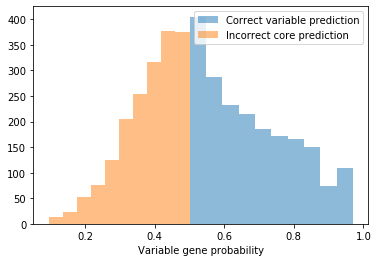

In [26]:
plt.hist(var_correct_df.var_prob, alpha=0.5, label='Correct variable prediction')
plt.hist(var_incorrect_df.var_prob, alpha=0.5, label='Incorrect core prediction')
plt.legend(loc='upper right')
plt.xlabel('Variable gene probability')

Ouch! I was hoping to get a peak around 0.4% so we could have shifted the cutoff down to 0.4, but the peak is at around 0.2%

Text(0.5, 0, 'Core gene probability')

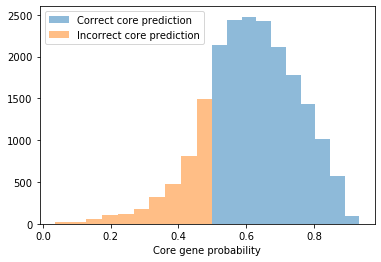

In [27]:
core_incorrect_df = comp_df[(comp_df.truelabel == 0) & (comp_df.predictions == 1)]
core_correct_df = comp_df[(comp_df.truelabel == 0) & (comp_df.predictions == 0)]

plt.hist(core_correct_df.core_prob, alpha=0.5, label='Correct core prediction')
plt.hist(core_incorrect_df.core_prob, alpha=0.5, label='Incorrect core prediction')
plt.legend(loc='upper left')
plt.xlabel('Core gene probability')

# Now calculate AUC and plot ROC

In [38]:
probs = xg_reg.predict_proba(X_test)
probs = probs[:, 1]

from sklearn.utils.class_weight import compute_sample_weight
# whether I use this weight or not seems to be pointless?
weight = compute_sample_weight(class_weight = 'balanced', y = y_test)

auc = roc_auc_score(y_test, probs, sample_weight = weight)
print('AUC: %.3f' % auc)

fpr, tpr, thresholds = roc_curve(y_test, probs, sample_weight = weight, 
                                 drop_intermediate = False)

AUC: 0.744


In [39]:
fpr.size, tpr.size

(23763, 23763)

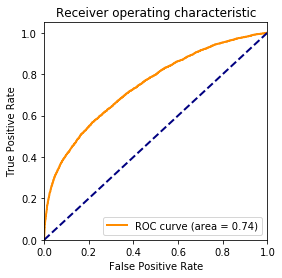

In [40]:
plt.rcParams['figure.figsize'] = (4, 4)

plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [41]:
from sklearn.metrics import confusion_matrix
tn, fp, fn, tp = confusion_matrix(y_train, xg_reg.predict(X_train)).ravel()
err_rate = (fp + fn) / (tp + tn + fn + fp)
print("Error rate  on train set : %.2f"%err_rate)
# Accuracy : 
acc = (tp + tn) / (tp + tn + fn + fp)
print("Accuracy  on train set  : %.2f"%acc)

tn, fp, fn, tp = confusion_matrix(y_test, xg_reg.predict(X_test)).ravel()
# Error rate : 
err_rate = (fp + fn) / (tp + tn + fn + fp)
print("Error rate  on test set : %.2f"%err_rate)
# Accuracy : 
acc = (tp + tn) / (tp + tn + fn + fp)
print("Accuracy  on test set  : %.2f"%acc)

Error rate  on train set : 0.15
Accuracy  on train set  : 0.85
Error rate  on test set : 0.23
Accuracy  on test set  : 0.77


# 10 cross fold validation 


In [28]:
kfold = KFold(n_splits=10, random_state=123)
kfold_results = cross_val_score(xg_reg, X, y, cv=kfold)
print("Accuracy: %.2f%% (%.2f%%)" % (kfold_results.mean()*100, kfold_results.std()*100))

Accuracy: 83.96% (4.55%)


# Beat a  regression

In [43]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(solver='lbfgs', multi_class='multinomial',
                           random_state=123, max_iter = 500) 
# default max_iter = 100. Complains about failing to converge with iter=100
lr.fit(X_train, y_train)
lr_preds = lr.predict(X_test)
accuracy = accuracy_score(y_test, lr_preds)
print('Logistic accuracy', accuracy)
lr_probs = lr.predict_proba(X_test)
lr_probs = lr_probs[:, 1]
auc = roc_auc_score(y_test, lr_probs)
print('Logistoc AUC: %.3f' % auc)#fpr, tpr, thresholds = roc_curve(y, probs)
get_confusion_matrix(y_test, lr_preds,  normalize=False)

C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


Logistic accuracy 0.8414925248125968
Logistoc AUC: 0.625


NameError: name 'get_confusion_matrix' is not defined

Similar accuracy, much worse AUC

# Now try TPOT

**WARNING** this takes *days* (and normally settles on random forests after an hour or so)

In [ ]:
data3 = data.copy()
data3.rename(index=str, columns={'Variable':'target'}, inplace=True)
X, y = data3.iloc[:,:-1],data3.iloc[:,-1]

X_train, X_test, y_train, y_test = train_test_split(X.astype(np.float64), y.astype(np.float64), test_size=0.25, random_state=123)


In [ ]:
from tpot import TPOTClassifier


In [ ]:
print('hi')
tpot = TPOTClassifier(generations = 5, population_size = 20, verbosity = 3,
                     random_state = 123)
tpot.fit(X_train, y_train)


In [ ]:
print(tpot.score(X_test, y_test))

In [ ]:
tpot.export('tpot_iris_pipeline.py')

In [ ]:
%%bash
cat tpot_iris_pipeline.py

# Merge XGBoost with regular regression

In [ ]:
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB

reg1 = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree = 0.3, 
                         learning_rate = 0.1, max_depth = 10, alpha = 10, \
                         n_estimators = 100)
reg2 = RandomForestClassifier(random_state=123, n_estimators=20, max_depth = 5)
reg3 = GaussianNB()
reg4 = LogisticRegression(solver='lbfgs', multi_class='multinomial',
                           random_state=123, max_iter=500)

eclass  = VotingClassifier(estimators=[ ('xgb', reg1), 
                                       ('rf', reg2), 
                                       ('nb', reg3), 
                                       ('lr', reg4) ],
                          voting = 'soft')
#If ‘hard’, uses predicted class labels for majority rule voting. Else if ‘soft’, predicts the 
# class label based on the argmax of the sums of 
# the predicted probabilities, 
# which is recommended for an ensemble of well-calibrated classifiers.

In [ ]:
eclass.fit(X_train,y_train)

eclass_preds = eclass.predict(X_test)

eclass_accuracy = accuracy_score(y_test, eclass_preds)
print('Voting accuracy:', eclass_accuracy)
eclass_probs = eclass.predict_proba(X_test)
eclass_probs = eclass_probs[:, 1]
eclass_auc = roc_auc_score(y_test, eclass_probs)
print('Voting AUC: %.3f' % eclass_auc)


Similar accuracy, slightly worse AUC, , but not much - does that mean this is all the predictions we can make with this data?

# SHAP XGBoost

In [29]:
shap.initjs()

Warning: Depending on the model chosen the next cell runs for a few hours!!!

Model (3) takes 10 minutes, Model (2) just runs for hours and hours.

You can speed up shap_values() by setting tree_limit to some number (normally it uses all trees generated by XGBoost), and to set approximate=True (but then you'll get only a rough estimate!!)

In [30]:
explainer = shap.TreeExplainer(xg_reg)
shap_values = explainer.shap_values(X)

In [31]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [32]:
shap.force_plot(explainer.expected_value, shap_values[1:1000,:], X.iloc[1:1000,:])

In [ ]:
a = shap.dependence_plot("Position on chromosome", shap_values, X, alpha=0.5, show=False, interaction_index='C genome')
plt.savefig('Pos_chromosome.png')

In other words: Blue is A genome, red is C genome. The ends of the chromosomes seem to be more important than the beginnings?
    

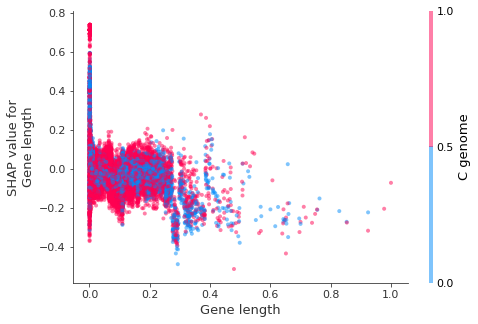

In [34]:
a = shap.dependence_plot("Gene length", shap_values, X, alpha=0.5, show=False,interaction_index='C genome')

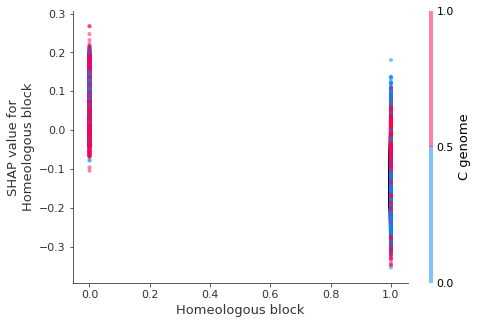

In [35]:
a = shap.dependence_plot("Homeologous block", shap_values, X, alpha=0.5, show=False ,interaction_index='C genome')

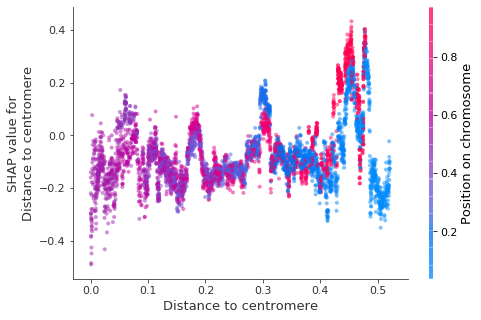

In [36]:
a = shap.dependence_plot("Distance to centromere", shap_values[X.chrA01==1], X[X.chrA01==1], alpha=0.5, show=False ,
                         interaction_index='auto')

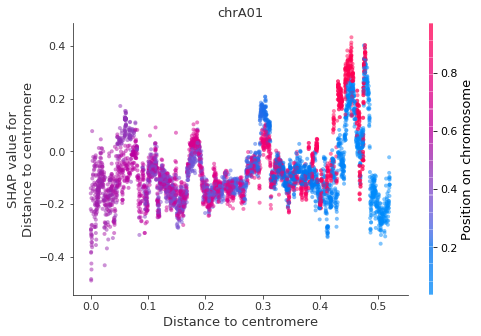

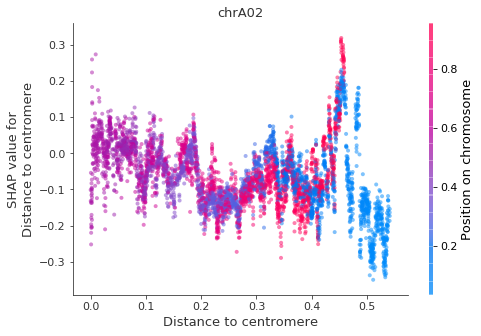

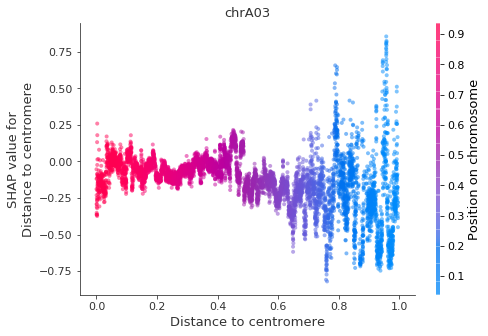

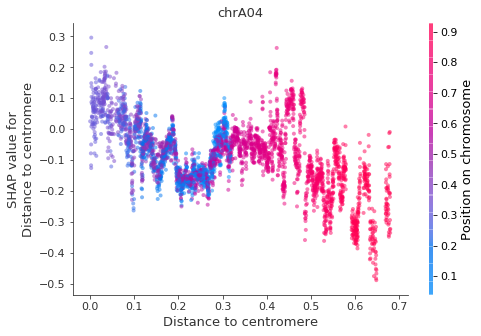

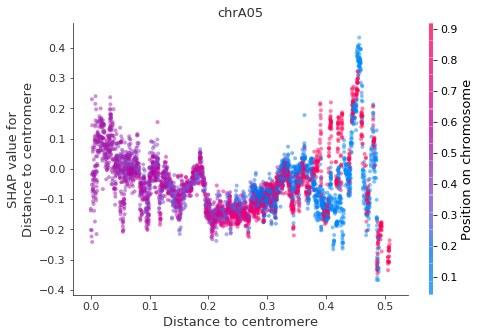

...

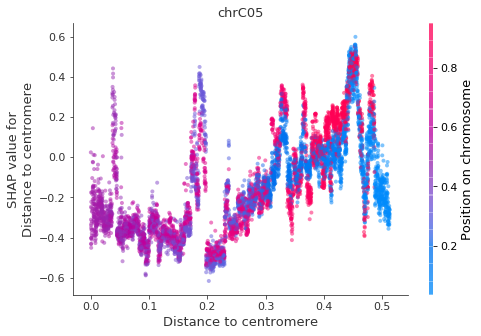

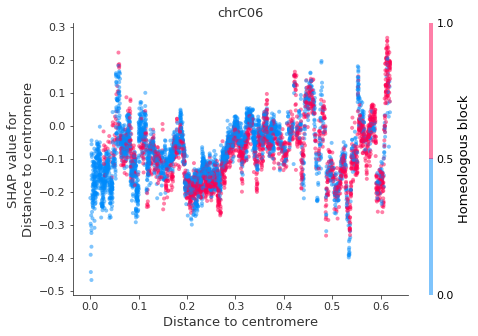

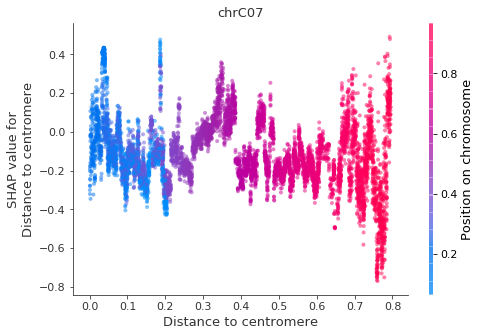

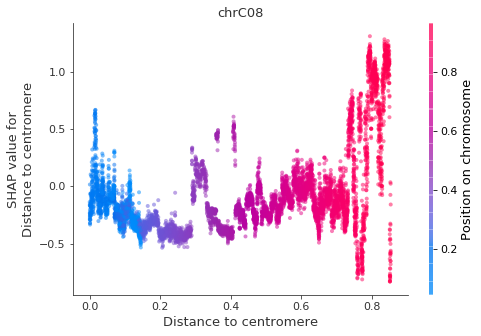

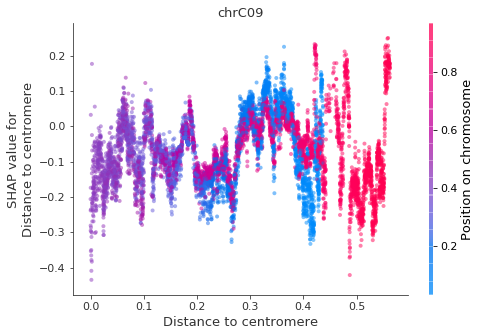

In [37]:
for chrom in ['chrA01', 'chrA02', 'chrA03', 'chrA04', 'chrA05', 'chrA06', 'chrA07',
       'chrA08', 'chrA09', 'chrA10', 'chrC01', 'chrC02', 'chrC03', 'chrC04',
       'chrC05', 'chrC06', 'chrC07', 'chrC08', 'chrC09']:
    a = shap.dependence_plot("Distance to centromere", shap_values[X[chrom]==1], X[X[chrom]==1], alpha=0.5,
                         interaction_index='auto', title = chrom)

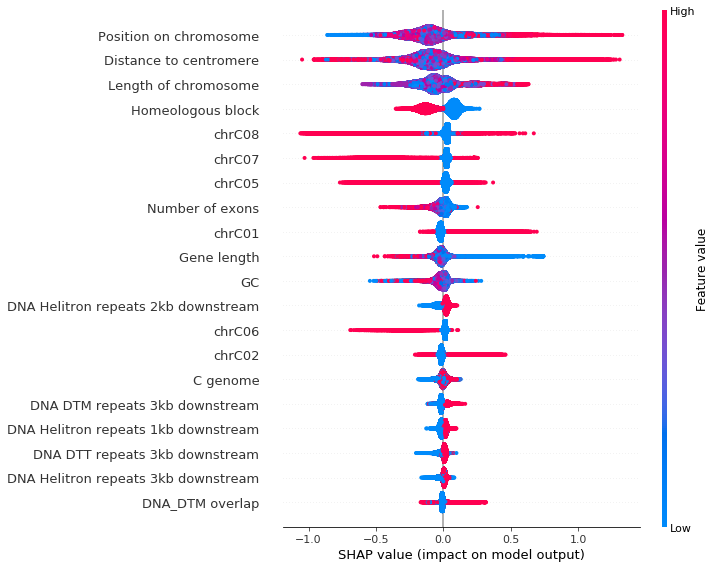

In [38]:
shap.summary_plot(shap_values, X, max_display = 20)

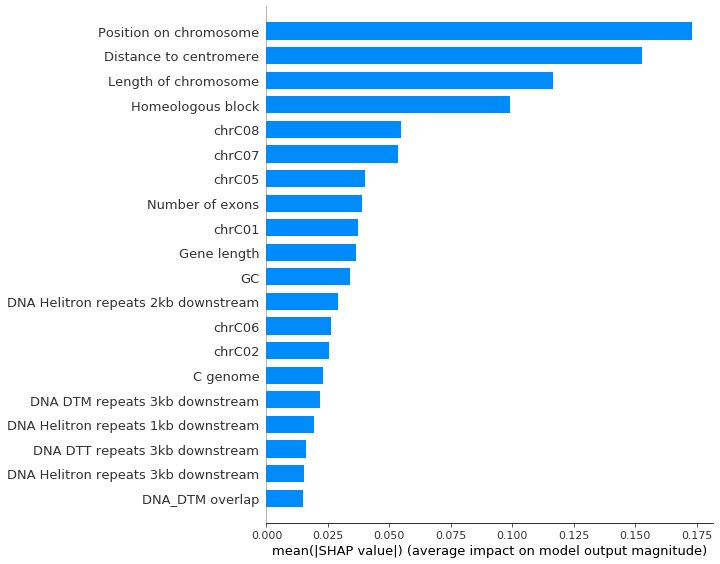

In [39]:
shap.summary_plot(shap_values, X, plot_type="bar")

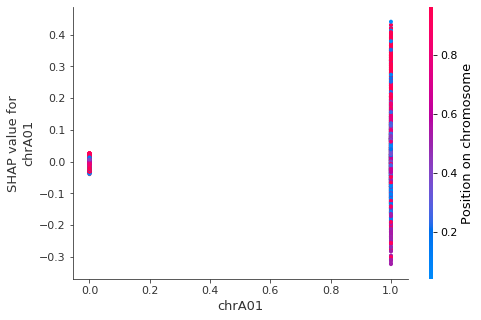

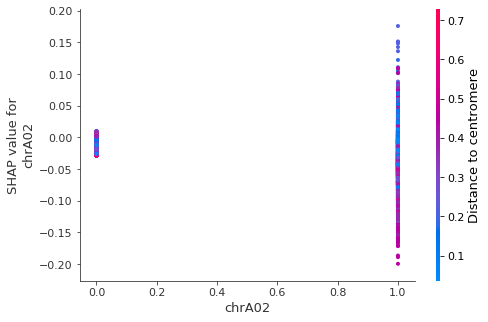

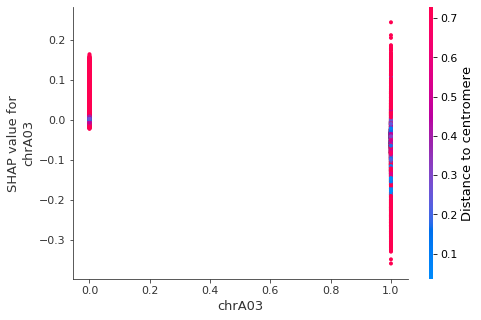

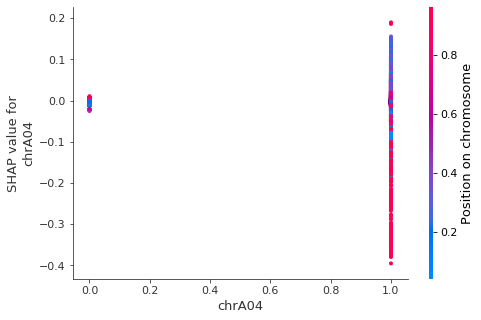

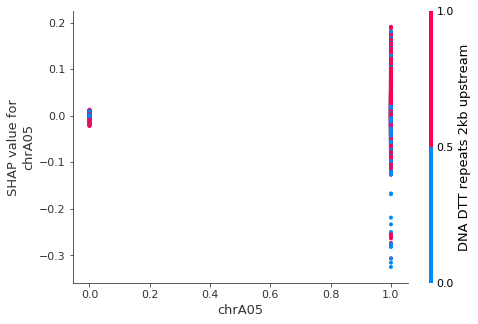

...

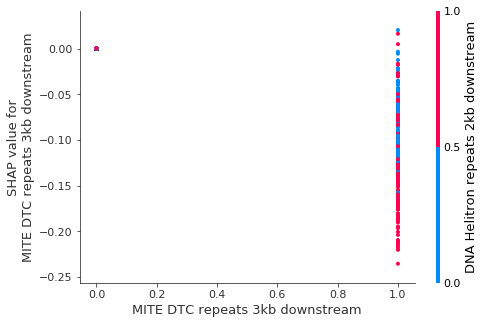

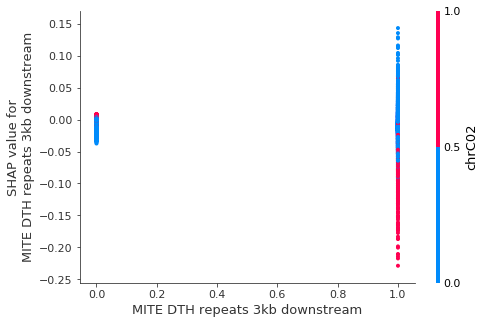

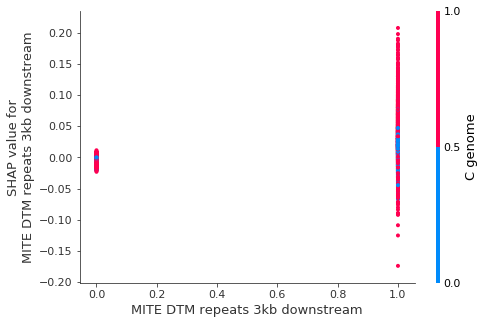

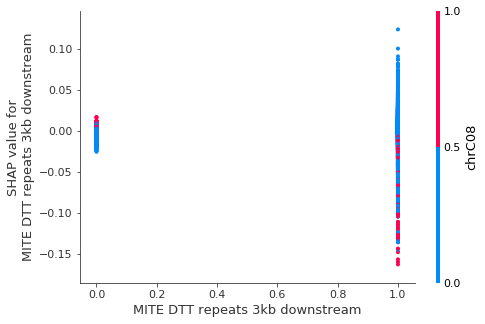

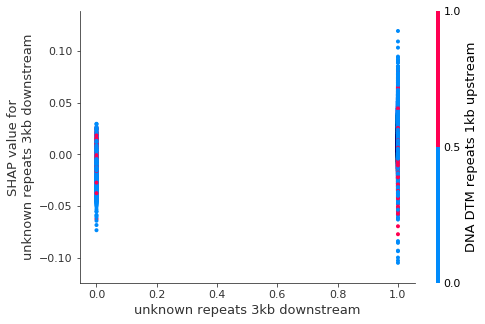

In [40]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X)

The classic 'gain' plot (The Gain is the most relevant attribute to interpret the relative importance of each feature.

‘Gain’ is the improvement in accuracy brought by a feature to the branches it is on.  from https://towardsdatascience.com/be-careful-when-interpreting-your-features-importance-in-xgboost-6e16132588e7 )

In [ ]:
plt.rcParams['figure.figsize'] = (8, 5)
xgb.plot_importance(xg_reg, importance_type = 'gain', 
                    show_values = False, height=0.4,
                    max_num_features = 20)
plt.tight_layout()

And the classic 'Cover' plot (‘Coverage’ measures the relative quantity of observations concerned by a feature.”) from same source as above

In [ ]:
xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

# Regular feature importance

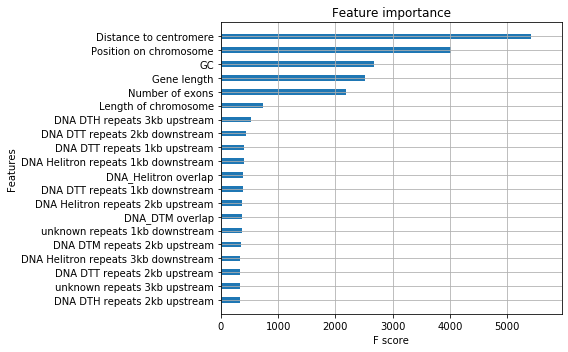

In [79]:
plt.rcParams['figure.facecolor']='white'

plt.rcParams['figure.figsize'] = (8.0, 5.0)

xgb.plot_importance(xg_reg, show_values=False, height=0.4, max_num_features = 20)
plt.tight_layout()
plt.savefig('importances.png')


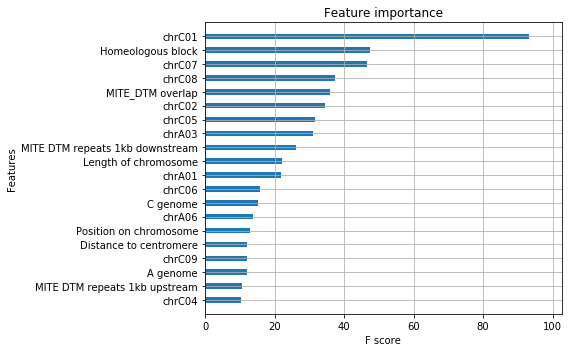

In [78]:
#Available importance_types = [‘weight’, ‘gain’, ‘cover’, ‘total_gain’, ‘total_cover’]
#plt.rcParams['figure.figsize'] = (12.0, 10.0)

xgb.plot_importance(xg_reg, importance_type = 'gain', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

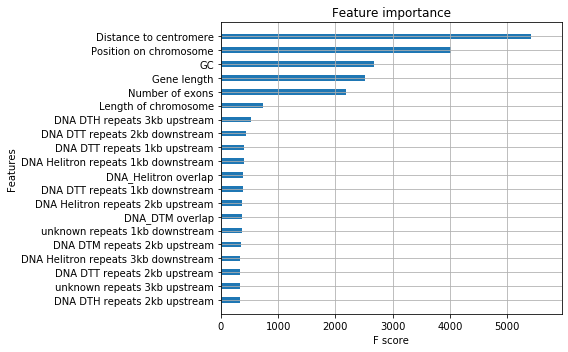

In [80]:
#Available importance_types = [‘weight’, ‘gain’, ‘cover’, ‘total_gain’, ‘total_cover’]
xgb.plot_importance(xg_reg, importance_type = 'weight', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

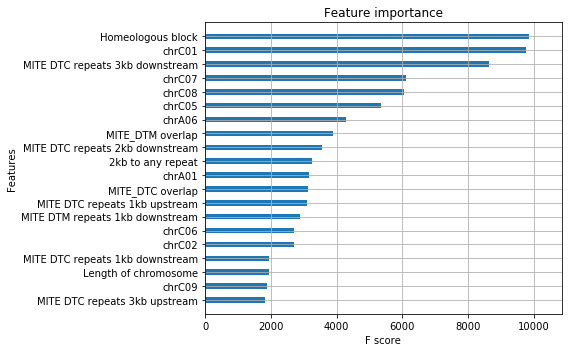

In [81]:
#Available importance_types = [‘weight’, ‘gain’, ‘cover’, ‘total_gain’, ‘total_cover’]
xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()
plt.savefig('relative_gains.png')

# Does chromosome length correlate with importance?

In [ ]:
f = 'cover'
gains = xg_reg.get_booster().get_score(importance_type=f)
chrom_gains = {}

for g in gains:
    if g.startswith('chr'): 
        chrom_gains[g] = gains[g]

chrom_lengths = {}
for line in open(r'H:\My Documents\Brassica_PanPangenome\Brassica_PanPanGenome\BuildPAVModel/Napus/withEDTARepeats/Darmor_NRGene_pseudomolecules_v1.4_chloroplast_mitochondrium_both_rounds.fasta.fai'):
    ll = line.split()
    
    name, length = ll[0], ll[1]
    if 'Chr0' in name: continue
    if 'harsh' in name: continue
        
    if 'jcf' in name: continue
    name = name.replace('_RaGOO','')
    chrom_lengths[name]= int(length)

chromtype = []
for a in chrom_lengths.keys():
    if 'chrA' in a:
        chromtype.append('A-genome')
    elif 'chrC' in a:
        chromtype.append('C-genome')
        
x = sorted(chrom_lengths)
df = pd.DataFrame(data={'lengths':[chrom_lengths[n] for n in x], 'Genome':chromtype,
                       'gains':[chrom_gains[n] for n in x]})
import seaborn as sns

x = sorted(chrom_gains)
sns.lmplot(x="lengths", y="gains", hue='Genome', data=df, palette='Set1')
#plt.tight_layout()

# PCA test

As a test, I want to know how a 'normal' regression works with the same data as above, but all 'merged' into principal components.

In [41]:
from sklearn.decomposition import PCA

In [42]:
pca = PCA(n_components = 5)

In [43]:
pca.fit(X)

PCA(copy=True, iterated_power='auto', n_components=5, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [44]:
new_X = pca.transform(X_train)
new_X

array([[-0.82238014, -0.57477587, -0.39562062, -0.73059952,  0.35710198],
       [-0.75430749, -0.01445606, -0.51896712,  1.456281  ,  0.53353376],
       [-0.81399074, -0.10410065, -0.58176017, -0.78230672,  0.38643839],
       ...,
       [-0.46425335, -0.47176554,  0.21891285,  0.05762663,  0.48965728],
       [ 1.97988558,  0.66212089, -2.15828892,  0.72032593, -0.30622759],
       [ 3.07115884,  1.55128374,  0.1481488 , -0.1465801 ,  1.94127035]])

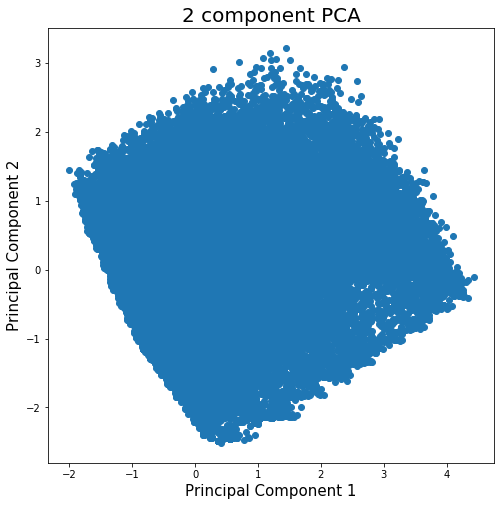

In [45]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)

ax.scatter(new_X[:,0], new_X[:,1])


Which PCs are important?

In [46]:
for a in pca.explained_variance_ratio_:
    print(a*100)

9.28675123798059
6.608263168357589
6.125791858976127
4.913015645669618
4.623065255187629


In [47]:
from sklearn.linear_model import LogisticRegression

In [48]:
logisticRegr = LogisticRegression(solver = 'lbfgs')

In [49]:
logisticRegr.fit(X_train, y_train)

C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [50]:
logisticRegr.score(X_test, y_test)

0.8414925248125968

On the other hand, looking at the values I used in the first place, the optimised parameters aren't very far away.

# Optimise XGBoost

*IMPORTANT* This uses a fork of skopt - https://github.com/darenr/scikit-optimize

    pip install https://github.com/darenr/scikit-optimize/archive/master.zip
    
As of this writing (10/10/2019) the main branch of skopt has a bug that stops it from working wiht scikit-learn https://github.com/scikit-optimize/scikit-optimize/issues/762

I used this code here: https://www.kaggle.com/nanomathias/bayesian-optimization-of-xgboost-lb-0-9769

In [51]:
bayes_cv_tuner = BayesSearchCV(
    estimator = xgb.XGBClassifier(
        n_jobs = 1,
        objective = 'binary:logistic',
        eval_metric = 'auc',
        silent=1,
    ),
    search_spaces = {
        'learning_rate': (0.01, 1.0, 'log-uniform'),
        'min_child_weight': (0, 10),
        'max_depth': (0, 50),
        'max_delta_step': (0, 20),
        'subsample': (0.01, 1.0, 'uniform'),
        'colsample_bytree': (0.01, 1.0, 'uniform'),
        'colsample_bylevel': (0.01, 1.0, 'uniform'),
        'reg_lambda': (1e-9, 1000, 'log-uniform'),
        'reg_alpha': (1e-9, 1.0, 'log-uniform'),
        'gamma': (1e-9, 0.5, 'log-uniform'),
        'min_child_weight': (0, 5),
        'n_estimators': (50, 100),
        'scale_pos_weight': (1e-6, 500, 'log-uniform')
    },    
    scoring = 'roc_auc',
    cv = StratifiedKFold(
        n_splits=3,
        shuffle=True,
        random_state=42
    ),
    n_jobs = 3,
    n_iter = 10,   
    verbose = 0,
    refit = True,
    random_state = 42
)


In [52]:

def status_print(optim_result):
    """Status callback durring bayesian hyperparameter search"""
    
    # Get all the models tested so far in DataFrame format
    all_models = pd.DataFrame(bayes_cv_tuner.cv_results_)    
    
    # Get current parameters and the best parameters    
    best_params = pd.Series(bayes_cv_tuner.best_params_)
    print('Model #{}\nBest ROC-AUC: {}\nBest params: {}\n'.format(
        len(all_models),
        np.round(bayes_cv_tuner.best_score_, 4),
        bayes_cv_tuner.best_params_
    ))
    
    # Save all model results
    clf_name = bayes_cv_tuner.estimator.__class__.__name__
    all_models.to_csv(clf_name+"_cv_results.csv")

In [53]:
result = bayes_cv_tuner.fit(X, y, callback=status_print)

Model #1
Best ROC-AUC: 0.6784
Best params: {'colsample_bylevel': 0.4160029192647807, 'colsample_bytree': 0.7304484857455519, 'gamma': 0.13031389926541354, 'learning_rate': 0.042815319280763466, 'max_delta_step': 13, 'max_depth': 21, 'min_child_weight': 2, 'n_estimators': 87, 'reg_alpha': 5.497557739289786e-07, 'reg_lambda': 0.05936070635912049, 'scale_pos_weight': 0.060830282487222144, 'subsample': 0.13556548021189216}

Model #2
Best ROC-AUC: 0.6943
Best params: {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, 'learning_rate': 0.7988179462781242, 'max_delta_step': 17, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 68, 'reg_alpha': 0.0005266983003701547, 'reg_lambda': 276.5424475574225, 'scale_pos_weight': 0.3016410771843142, 'subsample': 0.9923710598637134}

Model #3
Best ROC-AUC: 0.6943
Best params: {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, '

In [54]:
# this dictionary comes from BayesSearchCV
params = {'colsample_bylevel': 0.7366877378057127, 'colsample_bytree': 0.9399760402267441, 
          'gamma': 2.6498051478267012e-08, 'learning_rate': 0.0238149998729586, 
          'max_delta_step': 16, 'max_depth': 19, 'min_child_weight': 2, 
          'n_estimators': 77, 'reg_alpha': 0.011683028450342707, 
          'reg_lambda': 0.0048879464985534336, 
          'scale_pos_weight': 0.13267482411031659, 'subsample': 0.5689543694097536}
xg_reg = xgb.XGBClassifier(objective ='binary:logistic', eval_metric= 'auc', 
                           **params
)


In [60]:
xg_reg.fit(X_train,y_train, sample_weight = weight, verbose=True)

preds = xg_reg.predict(X_test)

In [61]:
accuracy = accuracy_score(y_test, preds)
print(accuracy)

0.8560241216131329


In [62]:
all_preds = xg_reg.predict(X)

In [63]:
confusion_matrix(y, all_preds)

array([[99781,   528],
       [15655,  3427]], dtype=int64)

In [64]:
from sklearn.metrics import matthews_corrcoef
print('MCC: %s'%(matthews_corrcoef(y, all_preds)))

MCC: 0.35695144848137583


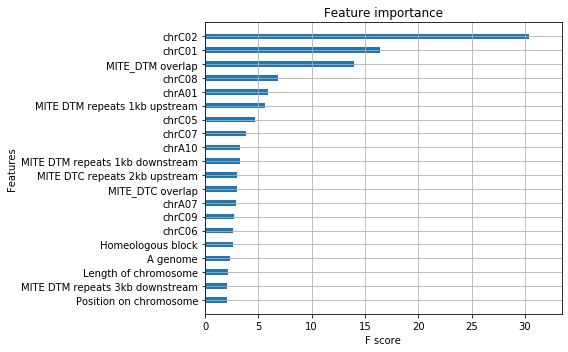

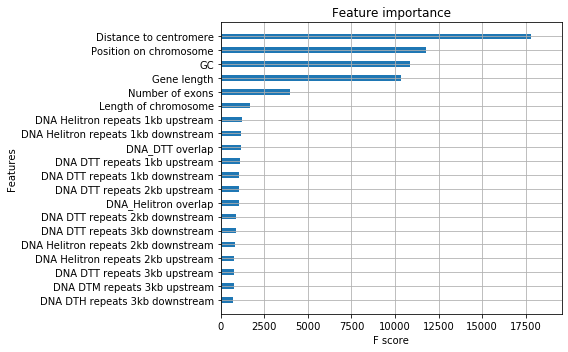

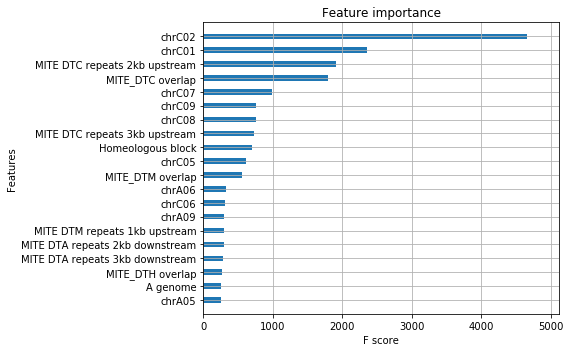

In [65]:
plt.rcParams['figure.facecolor']='white'

plt.rcParams['figure.figsize'] = (8, 5)
xgb.plot_importance(xg_reg, importance_type = 'gain', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()
xgb.plot_importance(xg_reg, importance_type = 'weight', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()
xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

In [78]:
explainer = shap.TreeExplainer(xg_reg)


In [ ]:
shap_values = explainer.shap_values(X)

In [ ]:
plt.rcParams['figure.figsize'] = (8, 5)

shap.summary_plot(shap_values, X, max_display = 20)

In [ ]:
a = shap.dependence_plot("Position on chromosome", shap_values, X, alpha=0.5, show=False, interaction_index='C genome')
plt.savefig('Pos_chromosome.png')

In other words: Blue is A genome, red is C genome, this was chosen automatically by strongest interaction by SHAP. The ends of the chromosomes seem to be more important than the beginnings?
    

In [ ]:
a = shap.dependence_plot("Gene length", shap_values, X, alpha=0.5, show=False,interaction_index='C genome')

In [ ]:
a = shap.dependence_plot("Homeologous block", shap_values, X, alpha=0.5, show=False ,interaction_index='C genome')

In [ ]:
a = shap.dependence_plot("Distance to centromere", shap_values, X, alpha=0.5, show=False ,
                         interaction_index='auto')

In [ ]:
for chrom in ['chrA01', 'chrA02', 'chrA03', 'chrA04', 'chrA05', 'chrA06', 'chrA07',
       'chrA08', 'chrA09', 'chrA10', 'chrC01', 'chrC02', 'chrC03', 'chrC04',
       'chrC05', 'chrC06', 'chrC07', 'chrC08', 'chrC09']:
    a = shap.dependence_plot("Distance to centromere", shap_values[X[chrom]==1], X[X[chrom]==1], alpha=0.5,
                         interaction_index='auto', title = chrom)

In [ ]:
shap.summary_plot(shap_values, X, plot_type="bar")

In [ ]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X)

The classic 'gain' plot (The Gain is the most relevant attribute to interpret the relative importance of each feature.

‘Gain’ is the improvement in accuracy brought by a feature to the branches it is on.  from https://towardsdatascience.com/be-careful-when-interpreting-your-features-importance-in-xgboost-6e16132588e7 )

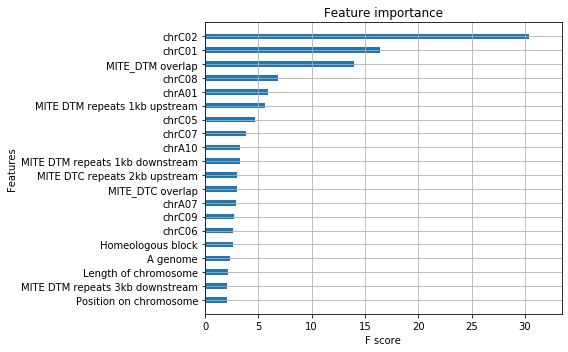

In [76]:
plt.rcParams['figure.figsize'] = (8, 5)
xgb.plot_importance(xg_reg, importance_type = 'gain', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

And the classic 'Cover' plot (‘Coverage’ measures the relative quantity of observations concerned by a feature.”) from same source as above

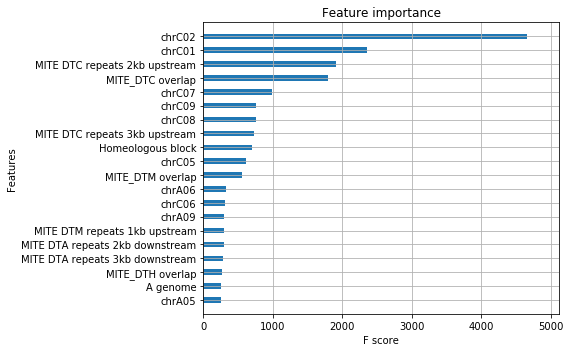

In [77]:
xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()